In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

data=pd.read_csv('IAS.csv')
df=pd.DataFrame(data)
print(df.head())



   RowID     State_Name  District_Name  Crop_Year       Season       Crop  \
0      0          Bihar        NALANDA       2005  Rabi             Wheat   
1      1          Assam  KARBI ANGLONG       2019  Whole Year       Onion   
2      2        Gujarat          ANAND       2020  Summer           Maize   
3      3      Karnataka   UTTAR KANNAD       2013  Rabi         Groundnut   
4      4  Uttar Pradesh        JAUNPUR       2016  Rabi             Onion   

      Area  Production  
0  81934.0    160425.0  
1    257.0       514.0  
2    100.0       100.0  
3   2872.0      4572.0  
4    110.0      1290.0  


In [5]:
df.describe()

,RowID,Crop_Year,Area,Production
count,73827.000000,73827.000000,7.382700e+04,7.273100e+04
mean,36913.000000,2013.657551,1.218297e+04,6.210320e+05
std,21312.163499,4.954910,5.348285e+04,1.749756e+07
min,0.000000,2005.000000,4.000000e-02,0.000000e+00
25%,18456.500000,2010.000000,8.100000e+01,8.900000e+01
50%,36913.000000,2014.000000,5.900000e+02,7.290000e+02
75%,55369.500000,2018.000000,4.500000e+03,7.200000e+03
max,73826.000000,2023.000000,8.580100e+06,1.125000e+09


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73827 entries, 0 to 73826
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   RowID          73827 non-null  int64  
 1   State_Name     73827 non-null  object 
 2   District_Name  73827 non-null  object 
 3   Crop_Year      73827 non-null  int64  
 4   Season         73827 non-null  object 
 5   Crop           73827 non-null  object 
 6   Area           73827 non-null  float64
 7   Production     72731 non-null  float64
dtypes: float64(2), int64(2), object(4)
memory usage: 4.5+ MB


In [ ]:
#checking for missing values
df.isnull().sum()

RowID               0
State_Name          0
District_Name       0
Crop_Year           0
Season              0
Crop                0
Area                0
Production       1096
dtype: int64

In [ ]:
#Number of unique values in each column
df.value_counts()

RowID  State_Name              District_Name           Crop_Year  Season       Crop          Area      Production
0      Bihar                   NALANDA                 2005       Rabi         Wheat         81934.00  160425.00     1
49221  Manipur                 IMPHAL EAST             2011       Whole Year   Bitter Gourd  12.00     64.00         1
49227  Uttar Pradesh           HARDOI                  2017       Rabi         Masoor        10166.00  10573.00      1
49226  Karnataka               GADAG                   2017       Kharif       Sunflower     9659.00   2575.00       1
49225  Assam                   HAILAKANDI              2017       Summer       Rice          2916.00   6357.00       1
                                                                                                                    ..
24593  Dadra and Nagar Haveli  DADRA AND NAGAR HAVELI  2006       Winter       Gram          187.00    150.00        1
24594  Bihar                   BANKA                 

In [18]:
k=df['Production'].mean()
df.fillna(k,inplace=True)

In [19]:
df.isnull().sum()

RowID            0
State_Name       0
District_Name    0
Crop_Year        0
Season           0
Crop             0
Area             0
Production       0
dtype: int64

In [ ]:
df.shape

<Axes: >

<Figure size 1400x800 with 0 Axes>

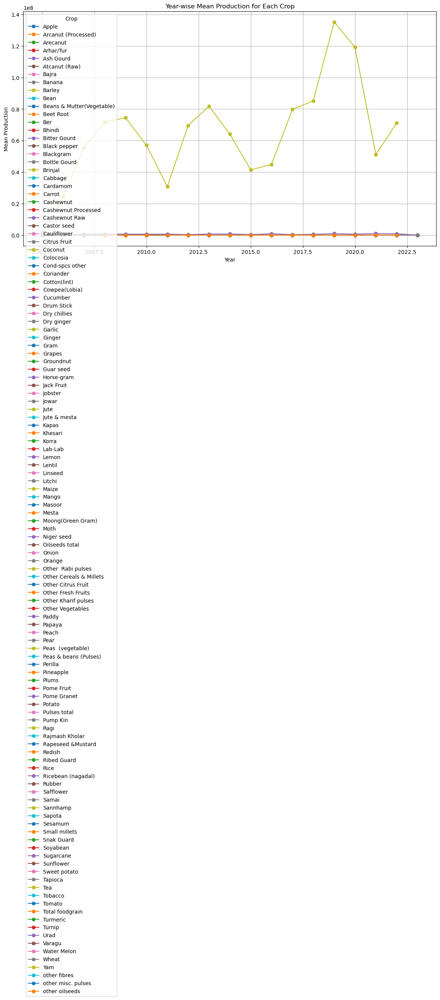

In [ ]:
# Group by year and crop to get the mean production for each crop

yearly_production_by_crop = df.groupby(['Crop_Year', 'Crop'])['Production'].mean().unstack()

# Plot the line chart for each crop
plt.figure(figsize=(14, 8))
for crop in yearly_production_by_crop.columns:
    plt.plot(yearly_production_by_crop.index, yearly_production_by_crop[crop], marker='o', linestyle='-', label=crop)

plt.xlabel('Year')
plt.ylabel('Mean Production')
plt.title('Year-wise Mean Production for Each Crop')
plt.legend(title='Crop')
plt.grid(True)
plt.show()

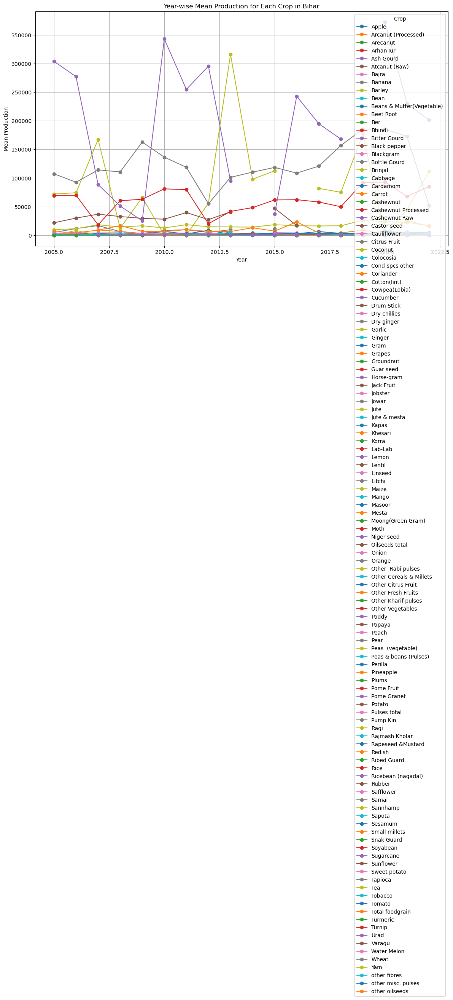

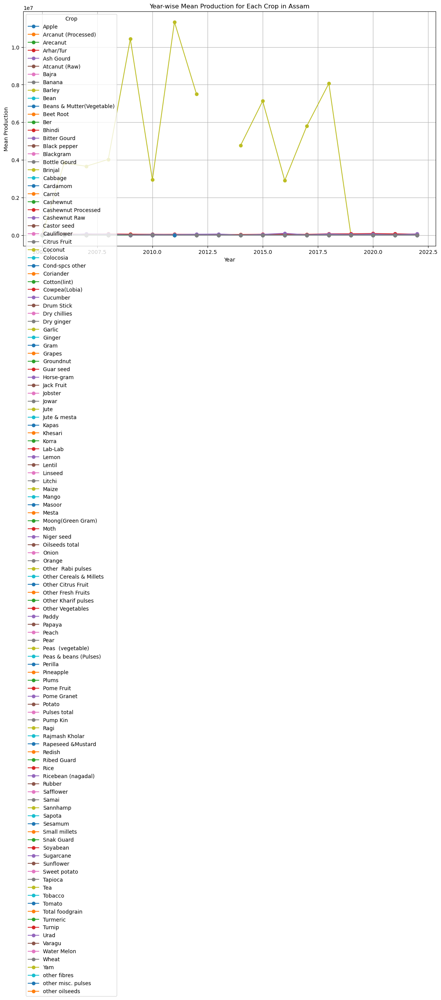

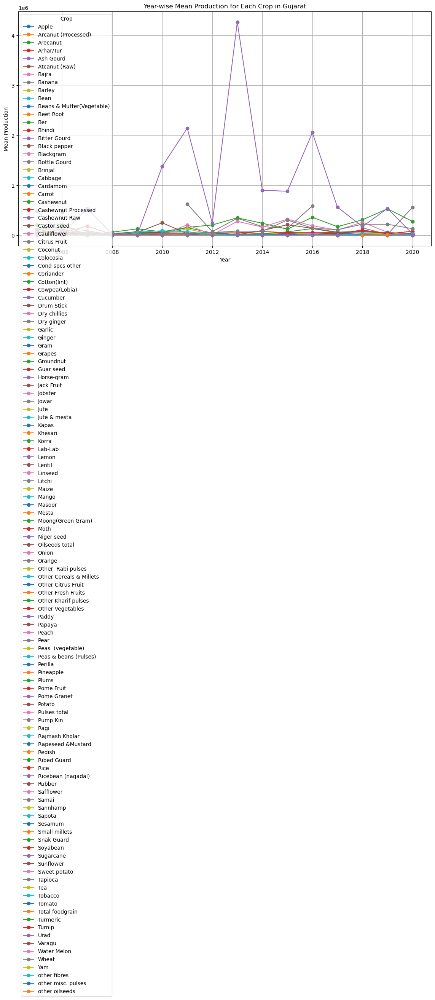

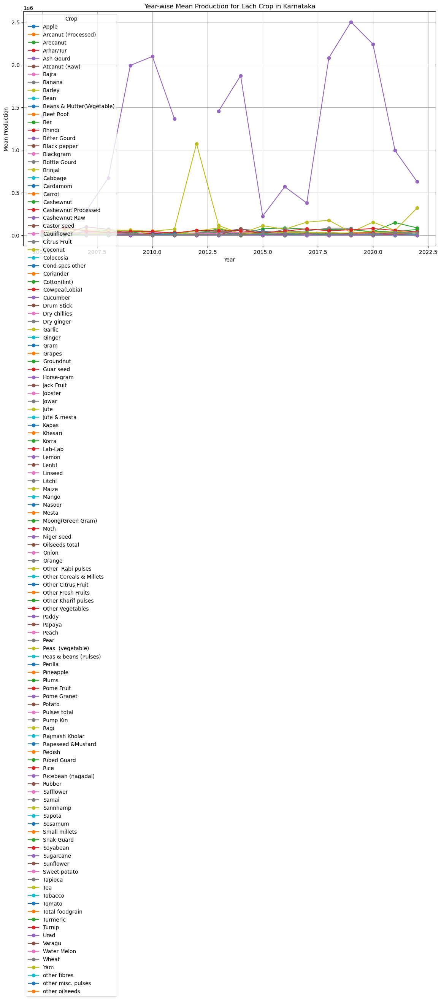

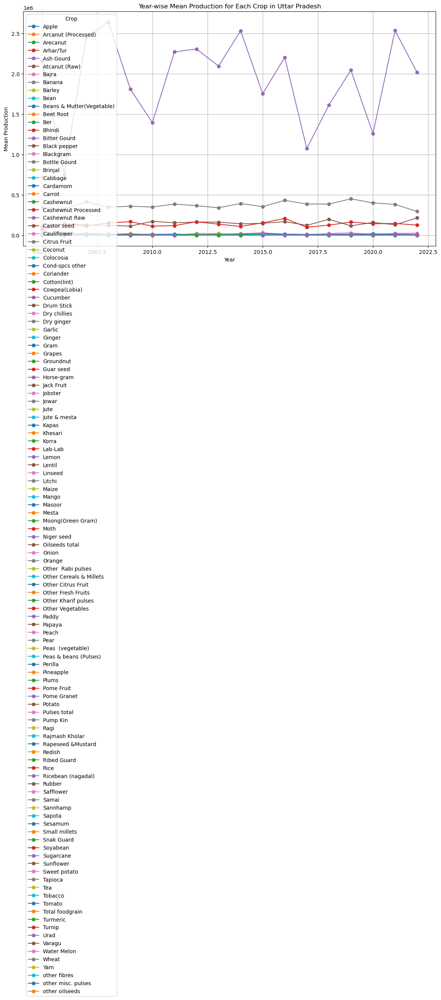

...

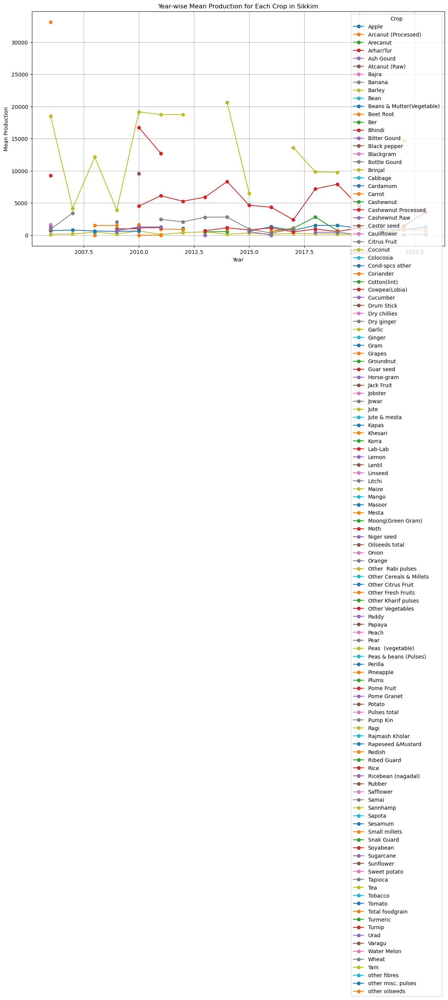

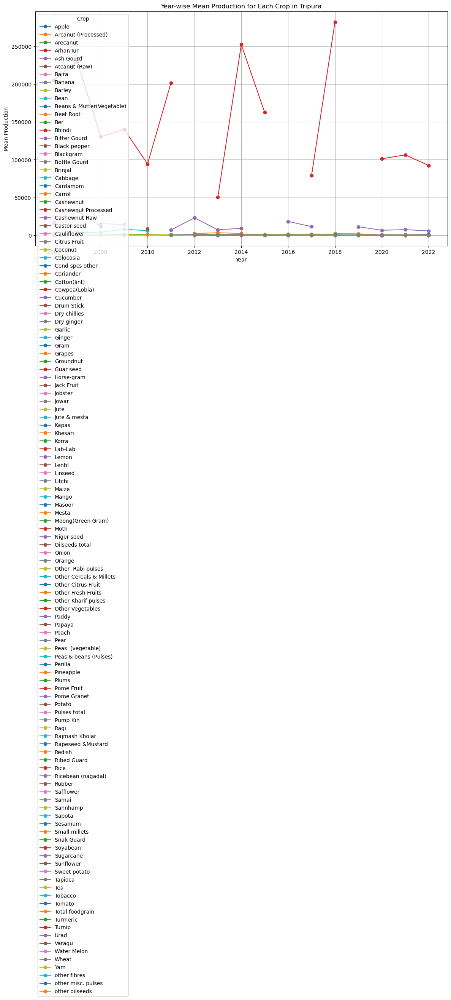

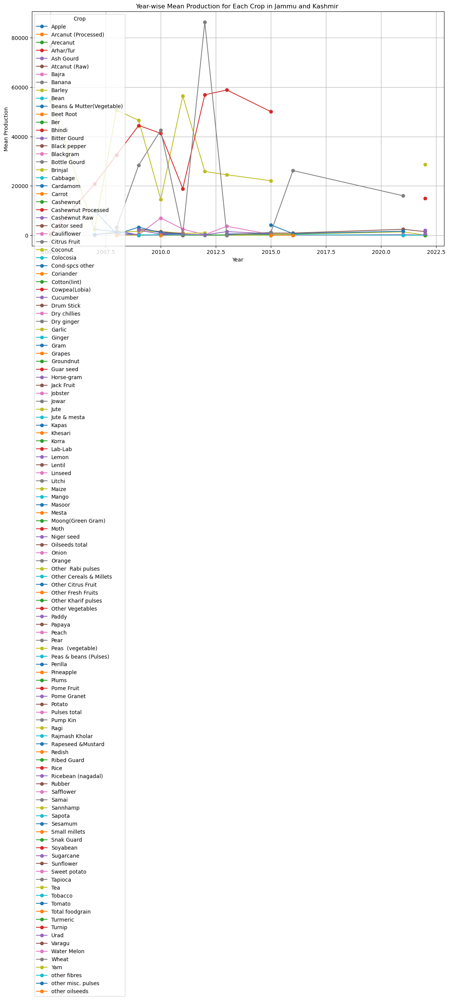

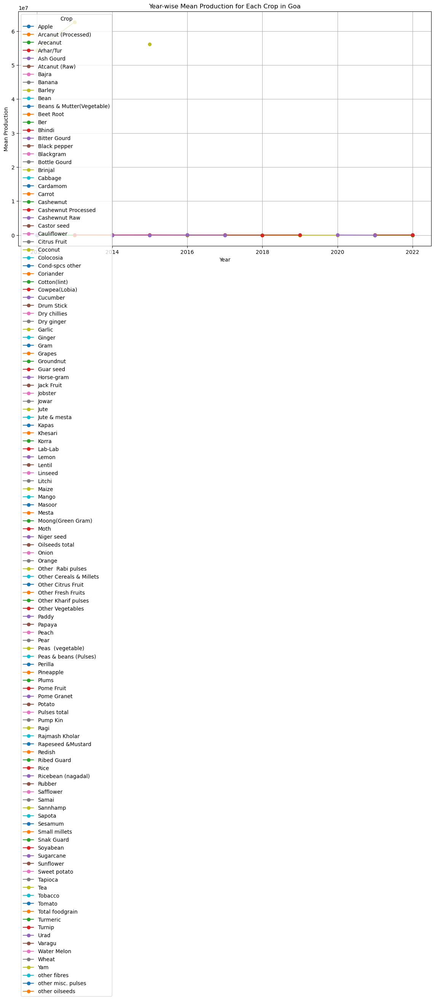

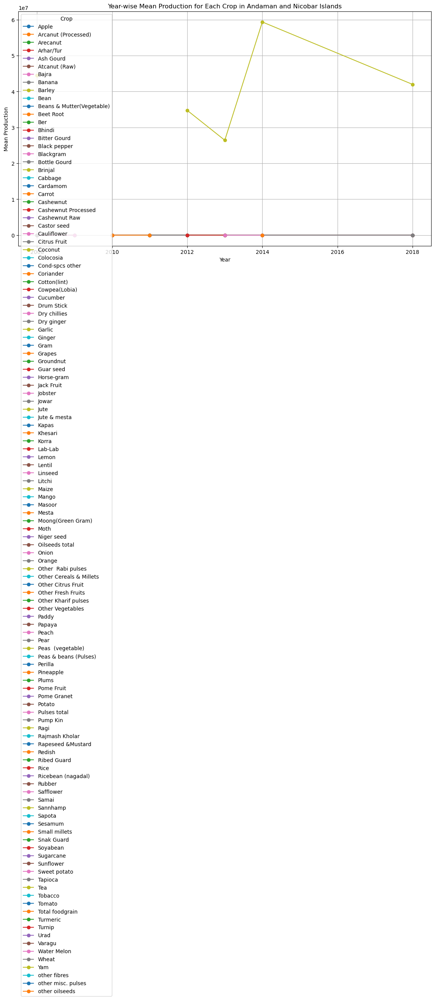

In [ ]:
# Calculate the mean production for each crop in each state

yearly_production_by_state_crop = df.groupby(['Crop_Year', 'State_Name', 'Crop'])['Production'].mean().unstack(level=-1)

# Plot the line chart for each state and crop
states = df['State_Name'].unique()
for state in states:
    plt.figure(figsize=(14, 8))
    state_data = yearly_production_by_state_crop.xs(state, level='State_Name')
    for crop in state_data.columns:
        plt.plot(state_data.index, state_data[crop], marker='o', linestyle='-', label=crop)
    
    plt.xlabel('Year')
    plt.ylabel('Mean Production')
    plt.title(f'Year-wise Mean Production for Each Crop in {state}')
    plt.legend(title='Crop')
    plt.grid(True)
    plt.show()

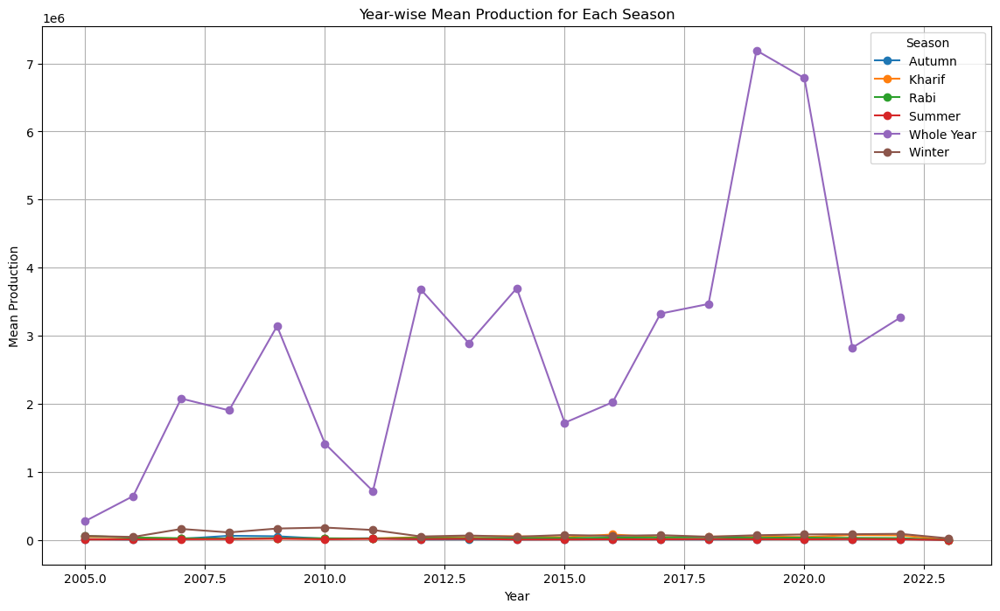

In [ ]:
# alculate the mean production for each year and season
yearly_production_by_season = df.groupby(['Crop_Year', 'Season'])['Production'].mean().unstack()

# Plot the line chart for each season
plt.figure(figsize=(14, 8))
for season in yearly_production_by_season.columns:
    plt.plot(yearly_production_by_season.index, yearly_production_by_season[season], marker='o', linestyle='-', label=season)

plt.xlabel('Year')
plt.ylabel('Mean Production')
plt.title('Year-wise Mean Production for Each Season')
plt.legend(title='Season')
plt.grid(True)
plt.show()

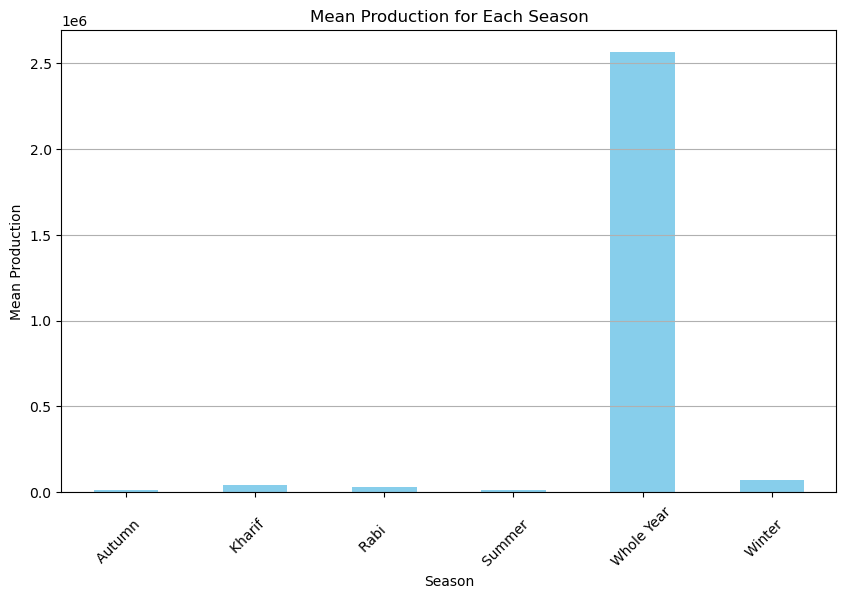

In [47]:
# What is the mean production for each season?
mean_production_by_season = df.groupby('Season')['Production'].mean()

# Plot the bar chart for each season
plt.figure(figsize=(10, 6))
mean_production_by_season.plot(kind='bar', color='skyblue')
plt.xlabel('Season')
plt.ylabel('Mean Production')
plt.title('Mean Production for Each Season')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

C:\Users\IFC-56\AppData\Local\Temp\ipykernel_728\479867291.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=season_data, y=season_data.index, palette='viridis')


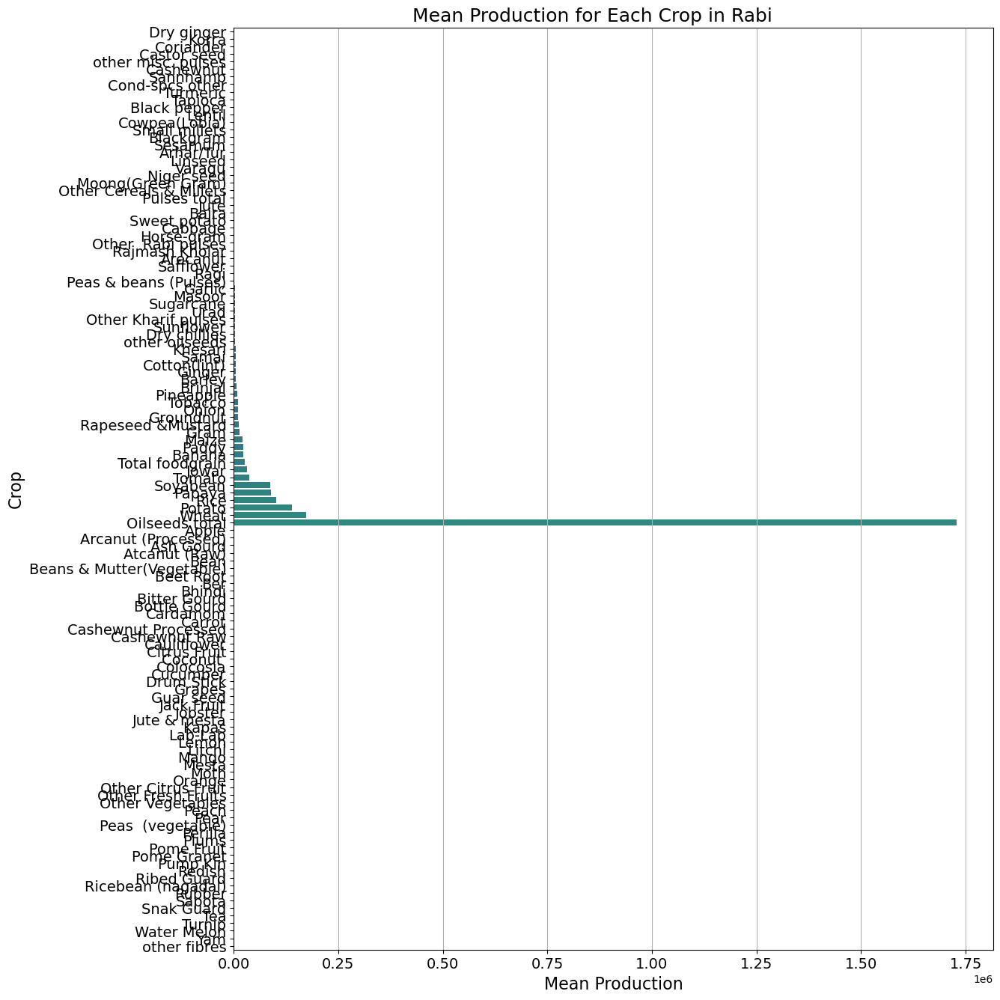

C:\Users\IFC-56\AppData\Local\Temp\ipykernel_728\479867291.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=season_data, y=season_data.index, palette='viridis')


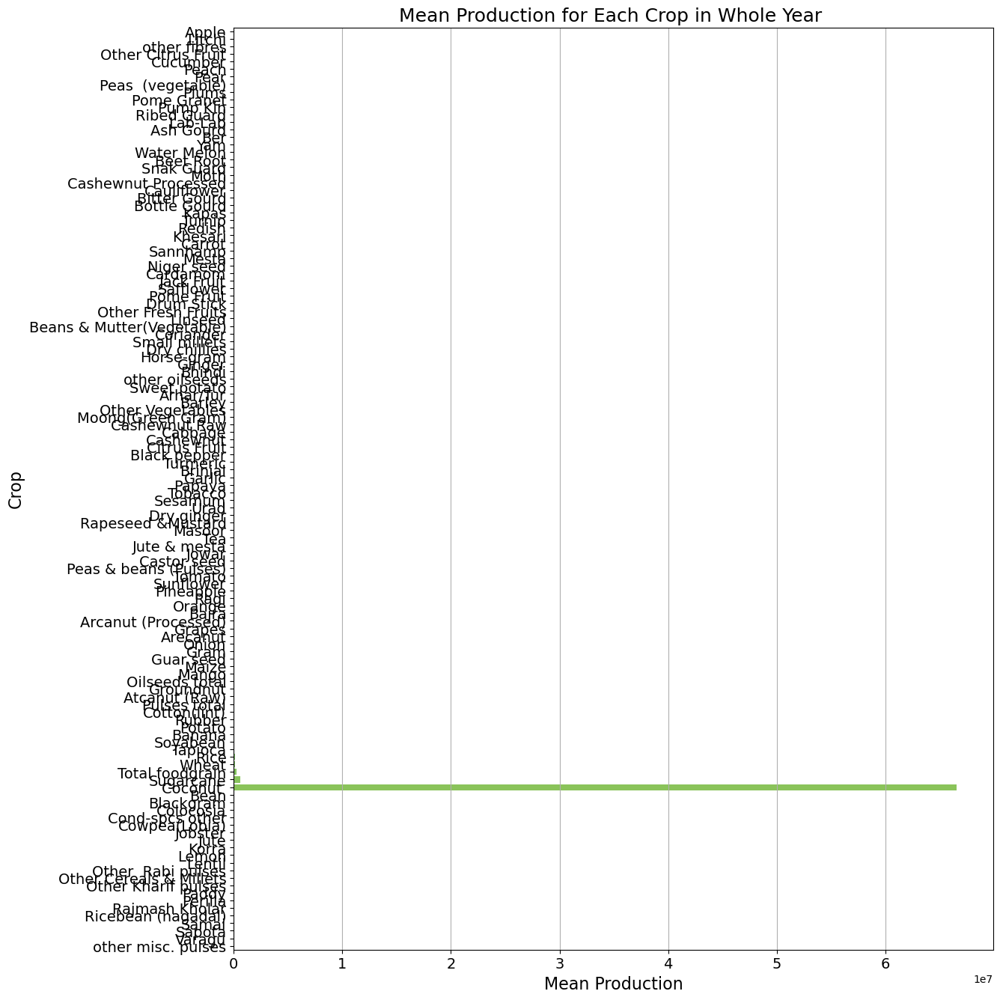

C:\Users\IFC-56\AppData\Local\Temp\ipykernel_728\479867291.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=season_data, y=season_data.index, palette='viridis')


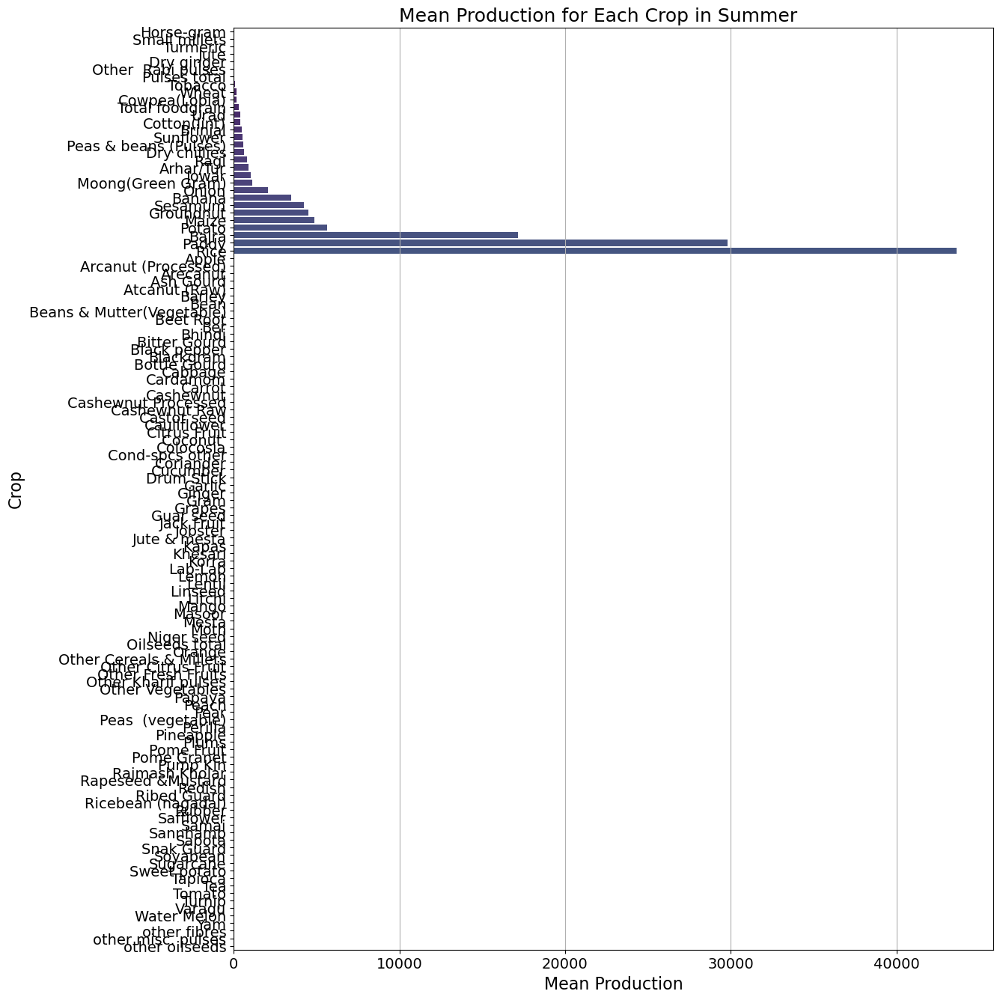

C:\Users\IFC-56\AppData\Local\Temp\ipykernel_728\479867291.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=season_data, y=season_data.index, palette='viridis')


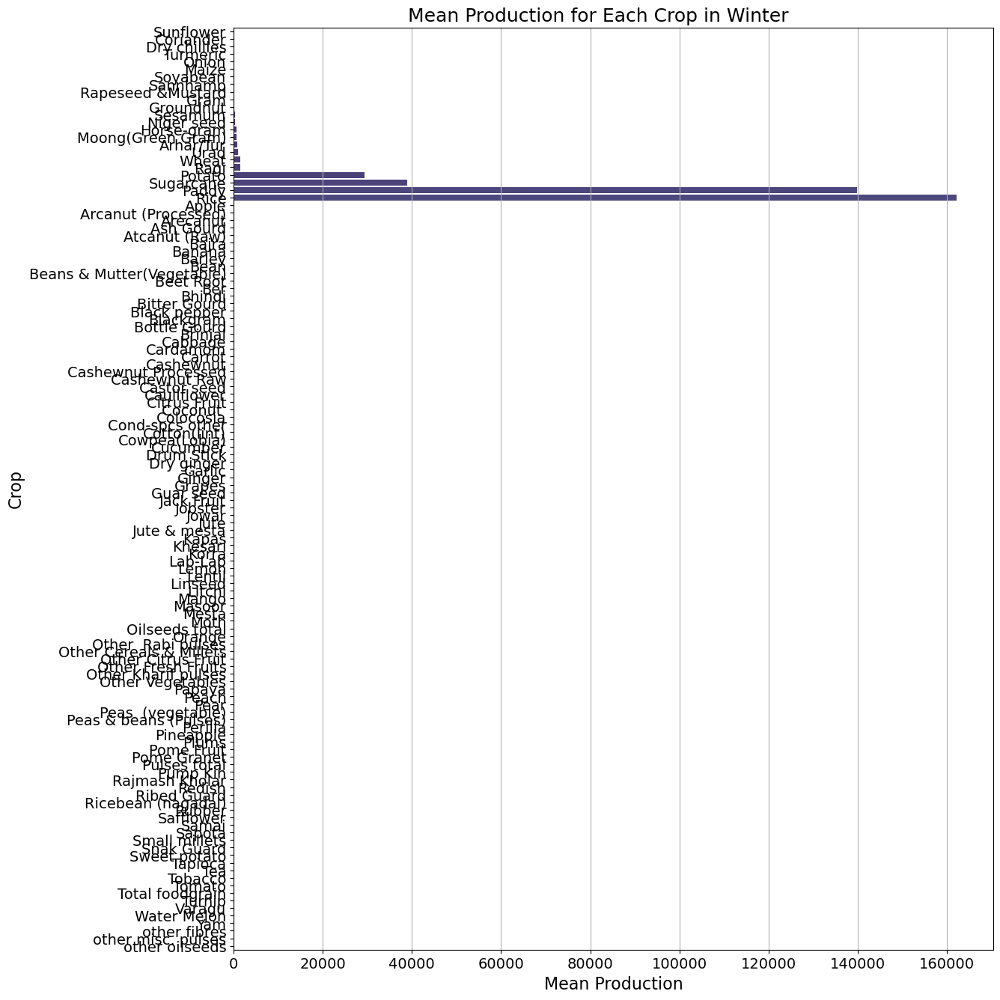

C:\Users\IFC-56\AppData\Local\Temp\ipykernel_728\479867291.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=season_data, y=season_data.index, palette='viridis')


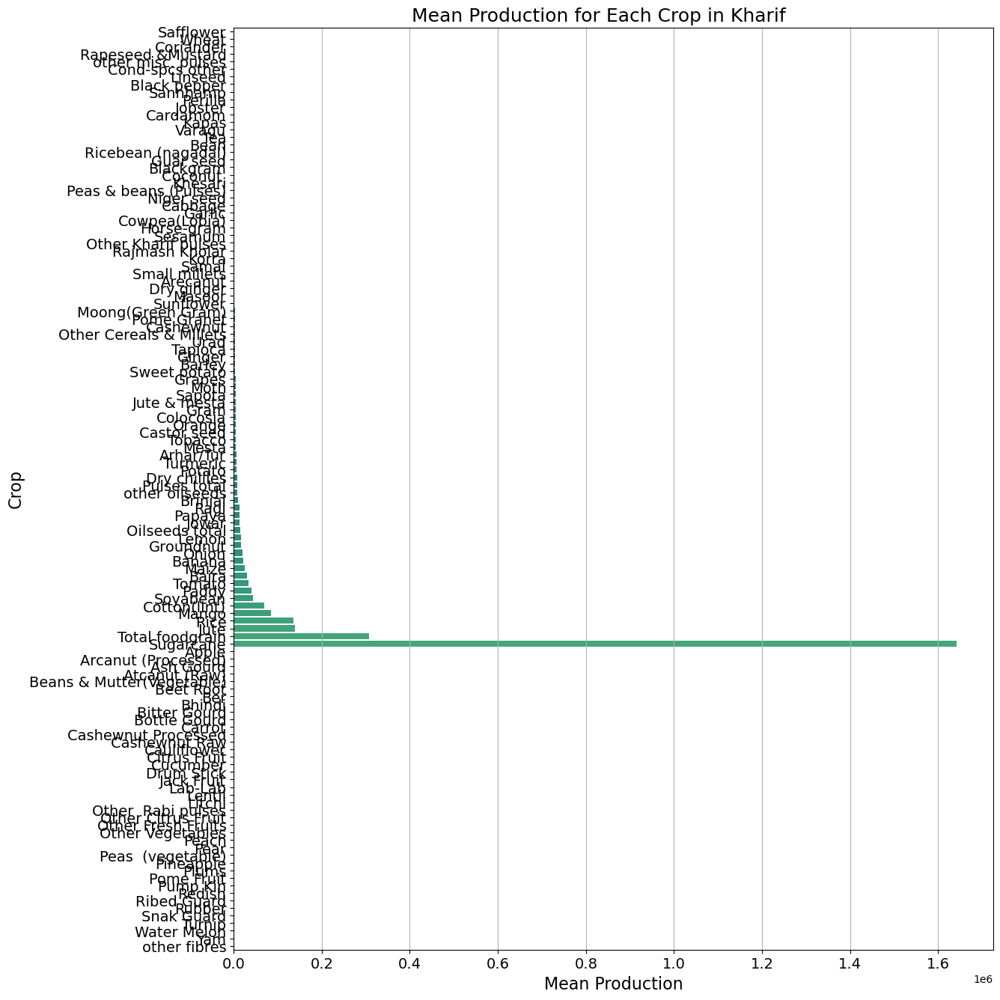

C:\Users\IFC-56\AppData\Local\Temp\ipykernel_728\479867291.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=season_data, y=season_data.index, palette='viridis')


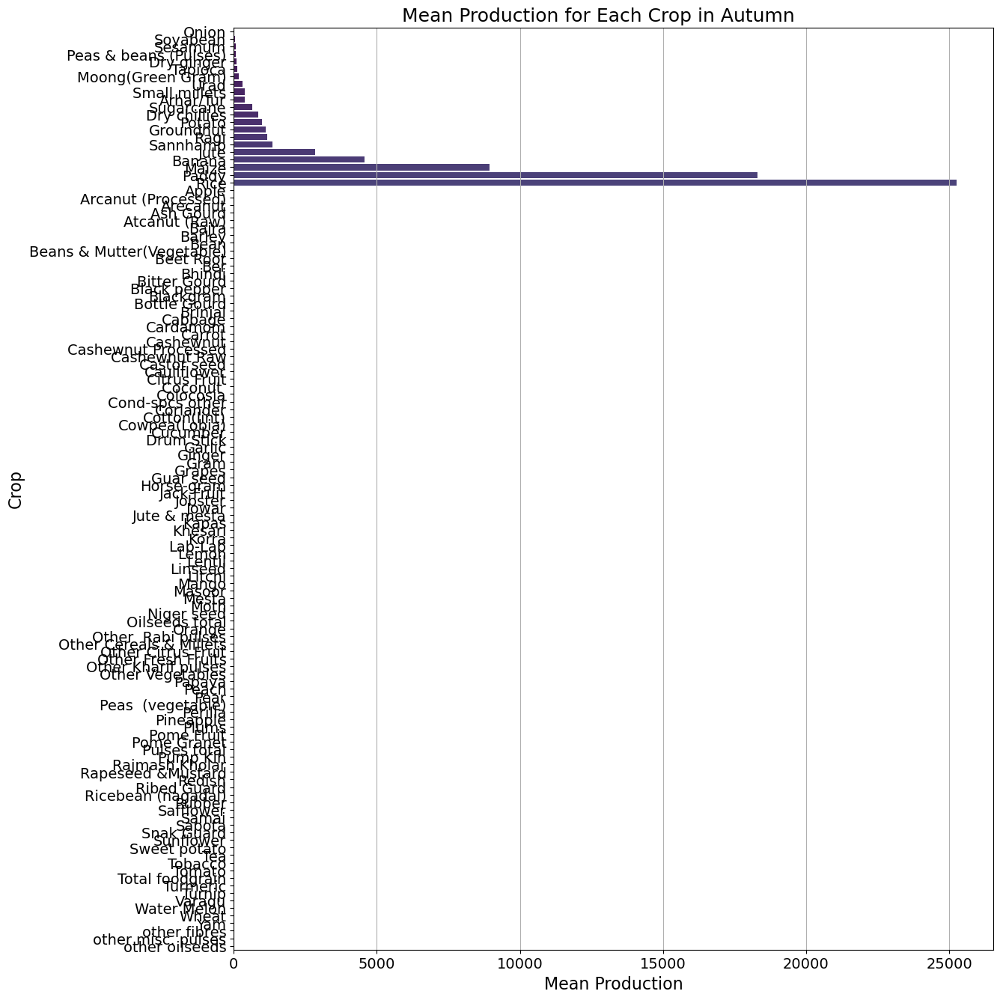

In [ ]:
# Calculate the mean production for each crop in each season

mean_production_by_season_crop = df.groupby(['Season', 'Crop'])['Production'].mean().unstack()
seasons = df['Season'].unique()
for season in seasons:
    plt.figure(figsize=(14, 14))  # Increase the height of the figure
    season_data = mean_production_by_season_crop.loc[season].sort_values()
    sns.barplot(x=season_data, y=season_data.index, palette='viridis')
    plt.xlabel('Mean Production', fontsize=16)
    plt.ylabel('Crop', fontsize=16)
    plt.title(f'Mean Production for Each Crop in {season}', fontsize=18)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(axis='x')
    plt.tight_layout(pad=3)
    plt.show()